# Traffic accidents in BCN

Listado de los accidentes gestionados por la Guardia Urbana en la ciudad de Barcelona. Incorpora el número de lesionados segun gravedad, el número de vehiculos y el punto de impacto. Las coordenadas se expresan en el sistema de referencia ED50 y en el sistema geográfico (longitud y latitud).

In [1]:
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
import folium
import pandas as pd
import geopandas
from geopandas import gpd
import seaborn as sns
import re

## Accidentes en bcn durante en 2018

In [2]:
acc_18 = pd.read_csv('https://opendata-ajuntament.barcelona.cat/data/dataset/e769eb9d-d778-4cd7-9e3a-5858bba49b20/resource/f94d9ac3-e46e-47cd-a3d0-a9b5b9639d86/download/2018_accidents_gu_bcn.csv')
acc_18.head()

,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Num_postal,Descripcio_dia_setmana,Dia_setmana,...,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,2018S000150,3,Sants-Montjuïc,12,la Marina del Prat Vermell,701819,Número 3 Zona Franca / E Zona Franca ...,69-75,Dilluns,Dl,...,No és causa del vianant,0,1,0,1,2,427265.97,4576644.81,2.129612,41.336163
1,2018S000761,3,Sants-Montjuïc,11,el Poble-sec,234001,Olímpic ...,5-7,Diumenge,Dg,...,No és causa del vianant,0,0,0,0,2,429210.58,4579530.49,2.152513,41.362326
2,2018S005151,3,Sants-Montjuïc,12,la Marina del Prat Vermell,370531,A Zona Franca / Número 6 Zona Franca ...,NaN,Dimecres,Dc,...,No és causa del vianant,0,1,0,1,2,427519.99,4575229.36,2.132817,41.323437
3,2018S000933,3,Sants-Montjuïc,12,la Marina del Prat Vermell,701819,Número 3 Zona Franca / E ...,69-75,Diumenge,Dg,...,No és causa del vianant,0,2,0,2,1,427360.59,4576569.22,2.130752,41.335490
4,2018S006926,3,Sants-Montjuïc,12,la Marina del Prat Vermell,370203,Número 3 Zona Franca ...,77-111,Divendres,Dv,...,No és causa del vianant,0,0,0,0,2,426842.33,4576816.19,2.124529,41.337668


In [3]:
acc_18.shape

(9936, 27)

In [4]:
acc_18.isna().sum()

Numero_expedient                0
Codi_districte                  0
Nom_districte                   0
Codi_barri                      0
Nom_barri                       0
Codi_carrer                     0
Nom_carrer                      1
Num_postal                   4798
Descripcio_dia_setmana          0
Dia_setmana                     0
Descripcio_tipus_dia            0
Any                             0
Mes_any                         0
Nom_mes                         0
Dia_mes                         0
Hora_dia                        0
Descripcio_torn                 0
Descripcio_causa_vianant        0
Numero_morts                    0
Numero_lesionats_lleus          0
Numero_lesionats_greus          0
Numero_victimes                 0
Numero_vehicles_implicats       0
Coordenada_UTM_X                0
Coordenada_UTM_Y                0
Longitud                        0
Latitud                         0
dtype: int64

In [5]:
acc_18.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9936 entries, 0 to 9935
Data columns (total 27 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Numero_expedient           9936 non-null   object 
 1   Codi_districte             9936 non-null   int64  
 2   Nom_districte              9936 non-null   object 
 3   Codi_barri                 9936 non-null   int64  
 4   Nom_barri                  9936 non-null   object 
 5   Codi_carrer                9936 non-null   int64  
 6   Nom_carrer                 9935 non-null   object 
 7   Num_postal                 5138 non-null   object 
 8   Descripcio_dia_setmana     9936 non-null   object 
 9   Dia_setmana                9936 non-null   object 
 10  Descripcio_tipus_dia       9936 non-null   object 
 11  Any                        9936 non-null   int64  
 12  Mes_any                    9936 non-null   int64  
 13  Nom_mes                    9936 non-null   objec

In [6]:
acc_18.nunique()

Numero_expedient             9926
Codi_districte                 10
Nom_districte                  10
Codi_barri                     73
Nom_barri                      73
Codi_carrer                  1168
Nom_carrer                   3201
Num_postal                   1459
Descripcio_dia_setmana          7
Dia_setmana                     7
Descripcio_tipus_dia            1
Any                             1
Mes_any                        12
Nom_mes                        12
Dia_mes                        31
Hora_dia                       24
Descripcio_torn                 3
Descripcio_causa_vianant        6
Numero_morts                    2
Numero_lesionats_lleus         13
Numero_lesionats_greus          3
Numero_victimes                13
Numero_vehicles_implicats      13
Coordenada_UTM_X             5411
Coordenada_UTM_Y             5407
Longitud                     5261
Latitud                      5203
dtype: int64

In [7]:
acc_18.describe().T

,count,mean,std,min,25%,50%,75%,max
Codi_districte,9936.0,4.835246e+00,2.989956,1.000000e+00,2.000000e+00,4.000000e+00,7.000000e+00,10.00
Codi_barri,9936.0,2.700322e+01,22.000695,1.000000e+00,8.000000e+00,2.000000e+01,4.300000e+01,73.00
Codi_carrer,9936.0,2.506095e+05,202218.951541,1.800000e+02,1.190030e+05,1.912040e+05,3.209080e+05,701857.00
Any,9936.0,2.018000e+03,0.000000,2.018000e+03,2.018000e+03,2.018000e+03,2.018000e+03,2018.00
Mes_any,9936.0,6.481985e+00,3.454569,1.000000e+00,4.000000e+00,6.000000e+00,1.000000e+01,12.00
Dia_mes,9936.0,1.565831e+01,8.786324,1.000000e+00,8.000000e+00,1.600000e+01,2.300000e+01,31.00
Hora_dia,9936.0,1.382649e+01,5.327171,0.000000e+00,1.000000e+01,1.400000e+01,1.800000e+01,23.00
Numero_morts,9936.0,2.113527e-03,0.045927,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.00
Numero_lesionats_lleus,9936.0,1.171598e+00,0.769475,0.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,12.00
Numero_lesionats_greus,9936.0,2.375201e-02,0.160018,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,2.00


In [8]:
acc_18.duplicated().sum()

0

In [29]:
acc_18.Nom_carrer.value_counts().head(60)

Corts Catalanes                                       266
Diagonal                                              240
Litoral (Llobregat)                                   141
Dalt (Besòs)                                          137
Aragó                                                 136
Dalt (Llobregat)                                      136
Meridiana                                             134
Litoral (Besòs)                                       131
General Mitre                                          72
València                                               64
B-10 (Llobregat)                                       63
B-20 (Llobregat)                                       60
Balmes                                                 59
B-10 (Besòs)                                           57
B-20 (Besòs)                                           56
Paral·lel                                              54
Vall d'Hebron                                          48
Maragall      

In [18]:
acc_18.loc[acc_18.Nom_carrer.str.contains('Bonanova', na=False)]

,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Num_postal,Descripcio_dia_setmana,Dia_setmana,...,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
5704,2018S008410,5,Sarrià-Sant Gervasi,23,Sarrià,28000,Bonanova / Augusta ...,NaN,Dissabte,Ds,...,No és causa del vianant,0,1,0,1,1,426759.95,4583807.32,2.122699,41.400627
5763,2018S002733,5,Sarrià-Sant Gervasi,23,Sarrià,44709,Augusta / Bonanova ...,NaN,Dimarts,Dm,...,No és causa del vianant,0,1,0,1,2,426759.95,4583807.32,2.122699,41.400627
5764,2018S005179,5,Sarrià-Sant Gervasi,23,Sarrià,44709,Bonanova / Augusta ...,NaN,Dijous,Dj,...,No és causa del vianant,0,1,0,1,1,426759.95,4583807.32,2.122699,41.400627
5796,2018S006460,5,Sarrià-Sant Gervasi,23,Sarrià,44709,Augusta / Bonanova ...,NaN,Divendres,Dv,...,No és causa del vianant,0,2,0,2,2,426759.95,4583807.32,2.122699,41.400627
5797,2018S008962,5,Sarrià-Sant Gervasi,23,Sarrià,44709,Augusta / Bonanova ...,NaN,Divendres,Dv,...,No és causa del vianant,0,1,0,1,2,426759.95,4583807.32,2.122699,41.400627
5832,2018S005082,5,Sarrià-Sant Gervasi,24,les Tres Torres,44709,Bonanova / Carrasco i Formiguera ...,NaN,Dilluns,Dl,...,No és causa del vianant,0,1,0,1,2,426818.23,4583848.67,2.123391,41.401005
5944,2018S001939,5,Sarrià-Sant Gervasi,23,Sarrià,44709,Bonanova / Anglí ...,90,Divendres,Dv,...,Creuar per fora pas de vianants,0,1,0,1,1,426884.80,4583912.08,2.124180,41.401582
6035,2018S006706,5,Sarrià-Sant Gervasi,24,les Tres Torres,44709,Bonanova ...,89-91,Dimecres,Dc,...,No és causa del vianant,0,1,0,1,2,427007.36,4583973.93,2.125639,41.402150
6114,2018S002304,5,Sarrià-Sant Gervasi,25,Sant Gervasi - la Bonanova,44709,Bonanova ...,66-68,Dijous,Dj,...,No és causa del vianant,0,1,0,1,2,427055.50,4584035.98,2.126207,41.402713
6158,2018S001427,5,Sarrià-Sant Gervasi,25,Sant Gervasi - la Bonanova,44709,Bonanova ...,67,Dijous,Dj,...,No és causa del vianant,0,1,0,1,2,427108.27,4584047.05,2.126837,41.402818


In [30]:
acc_18.columns

Index(['Numero_expedient', 'Codi_districte', 'Nom_districte', 'Codi_barri',
       'Nom_barri', 'Codi_carrer', 'Nom_carrer', 'Num_postal ',
       'Descripcio_dia_setmana', 'Dia_setmana', 'Descripcio_tipus_dia', 'Any',
       'Mes_any', 'Nom_mes', 'Dia_mes', 'Hora_dia', 'Descripcio_torn',
       'Descripcio_causa_vianant', 'Numero_morts', 'Numero_lesionats_lleus',
       'Numero_lesionats_greus', 'Numero_victimes',
       'Numero_vehicles_implicats', 'Coordenada_UTM_X', 'Coordenada_UTM_Y',
       'Longitud', 'Latitud'],
      dtype='object')

In [31]:
acc_18.drop(['Codi_carrer', 'Num_postal ', 'Coordenada_UTM_X', 'Coordenada_UTM_Y'], axis=1, inplace=True)

### Street types

- creation of a new column with the different categories of streets in the city. we make a register of 3 differents types:
    - acces and rondas
    - main streets
    - internal street

In [286]:
acces = ['B-', 'litoral', 'dalt', 'mig', 'C-', 'Zona Franca', 'Autovia', 'Carretera', 'Ildefons cer', 'Ronda', 'Sant Cugat','Hebron',
        'Via Favència', 'favencia']

main_st = ['Corts Catalanes', 'Diagonal', 'Aragó', 'Meridiana', 'General Mitre', 'València', 'Balmes', 'Paral·lel', 'Maragall',
        'Augusta', 'Laietana', 'Urgell', 'Sant Joan', 'Tetuan', 'Bonanova', 'Muntaner', 'Numancia','Colom', 'Avinguda', 'Sants',
           'Mandri', 'Gran de','Tarragona', 'Tibidabo', 'Icária', 'Carrilet', 'Picasso', 'Sarrià', 'Urgell', 'Marina', 'fabra i puig'
          'Carles', 'Les corts', 'collblanc', 'Riera Blanca', 'Maillol', 'Cardenal reig', 'via']

internal_st = []

In [287]:
pattern1 = '|'.join(acces)
pattern2 = '|'.join(main_st)
#acc_18['Nom_carrer'].apply(lambda x: 'acces street' if x.str.contains(pattern, case=False, na=False))
acc_18.loc[acc_18['Nom_carrer'].str.contains(pattern1 , case=False, na=False), 'Street_type'] = 'acces-Highway'
acc_18.loc[acc_18['Nom_carrer'].str.contains(pattern2 , case=False, na=False), 'Street_type'] = 'Main street'
acc_18['Street_type'].fillna('internal street', inplace=True)
acc_18.Street_type.value_counts()

internal street    4899
Main street        3833
acces-Highway      1204
Name: Street_type, dtype: int64

### Datetime

- To make this DataFrame more manipulated we will create a datetime column qith the information that it is available. 

In [34]:
acc_18[['Descripcio_dia_setmana', 'Dia_setmana', 'Descripcio_tipus_dia', 'Any','Mes_any', 'Nom_mes', 'Dia_mes', 'Hora_dia', 'Descripcio_torn']].head()

,Descripcio_dia_setmana,Dia_setmana,Descripcio_tipus_dia,Any,Mes_any,Nom_mes,Dia_mes,Hora_dia,Descripcio_torn
0,Dilluns,Dl,Laboral,2018,1,Gener,8,7,Matí
1,Diumenge,Dg,Laboral,2018,1,Gener,28,19,Tarda
2,Dimecres,Dc,Laboral,2018,7,Juliol,4,13,Matí
3,Diumenge,Dg,Laboral,2018,2,Febrer,4,7,Matí
4,Divendres,Dv,Laboral,2018,9,Setembre,14,6,Matí


In [35]:
acc_18['datetime'] = pd.to_datetime(dict(year=acc_18.Any, month=acc_18.Mes_any, day=acc_18.Dia_mes, hour=acc_18.Hora_dia))

In [36]:
acc_18.drop(['Dia_setmana','Any', 'Mes_any', 'Nom_mes', 'Dia_mes', 'Hora_dia'], axis=1, inplace=True)

In [37]:
acc_18.head()

,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Nom_carrer,Descripcio_dia_setmana,Descripcio_tipus_dia,Descripcio_torn,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud,Street_type,datetime
0,2018S000150,3,Sants-Montjuïc,12,la Marina del Prat Vermell,Número 3 Zona Franca / E Zona Franca ...,Dilluns,Laboral,Matí,No és causa del vianant,0,1,0,1,2,2.129612,41.336163,acces-Highway,2018-01-08 07:00:00
1,2018S000761,3,Sants-Montjuïc,11,el Poble-sec,Olímpic ...,Diumenge,Laboral,Tarda,No és causa del vianant,0,0,0,0,2,2.152513,41.362326,internal street,2018-01-28 19:00:00
2,2018S005151,3,Sants-Montjuïc,12,la Marina del Prat Vermell,A Zona Franca / Número 6 Zona Franca ...,Dimecres,Laboral,Matí,No és causa del vianant,0,1,0,1,2,2.132817,41.323437,acces-Highway,2018-07-04 13:00:00
3,2018S000933,3,Sants-Montjuïc,12,la Marina del Prat Vermell,Número 3 Zona Franca / E ...,Diumenge,Laboral,Matí,No és causa del vianant,0,2,0,2,1,2.130752,41.335490,acces-Highway,2018-02-04 07:00:00
4,2018S006926,3,Sants-Montjuïc,12,la Marina del Prat Vermell,Número 3 Zona Franca ...,Divendres,Laboral,Matí,No és causa del vianant,0,0,0,0,2,2.124529,41.337668,acces-Highway,2018-09-14 06:00:00


# 2)DESCRIPTIVE STATISTICS

## 2.1Accidents in Time

In [39]:
acc_by_time_day = acc_18.groupby(['Descripcio_tipus_dia','Descripcio_torn'], as_index=False).sum()

In [40]:
acc_by_time_day

,Descripcio_tipus_dia,Descripcio_torn,Codi_districte,Codi_barri,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud
0,Laboral,Matí,19235,107576,3,4466,70,4539,7516,21477.109042,410596.854720
1,Laboral,Nit,5632,31576,9,1368,32,1409,2253,2534.872418,89813.120335
2,Laboral,Tarda,23176,129152,9,5807,134,5950,9324,12584.786663,365735.369331


### - Amound of Accidents by day of the year

In [53]:

acc_by_day = acc_18.groupby([acc_18.datetime.dt.date, acc_18.Descripcio_dia_setmana ], as_index=False).sum()
acc_by_day

,Descripcio_dia_setmana,Codi_districte,Codi_barri,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud
0,Dilluns,84,501,0,16,0,16,29,34.740860,662.400544
1,Dimarts,127,685,0,28,1,29,52,58.282913,1117.925466
2,Dimecres,106,592,0,25,1,26,43,49.590015,952.220931
3,Dijous,116,617,0,29,0,29,46,53.927204,1034.827812
4,Divendres,102,553,0,24,1,25,41,47.527730,910.796606
...,...,...,...,...,...,...,...,...,...,...
360,Dijous,123,672,0,31,0,31,56,58.497111,1117.737013
361,Divendres,160,968,0,29,0,29,53,2242.338103,1076.464230
362,Dissabte,71,362,0,29,0,29,35,41.107317,786.445302
363,Diumenge,87,511,0,16,0,16,25,30.448335,579.704679


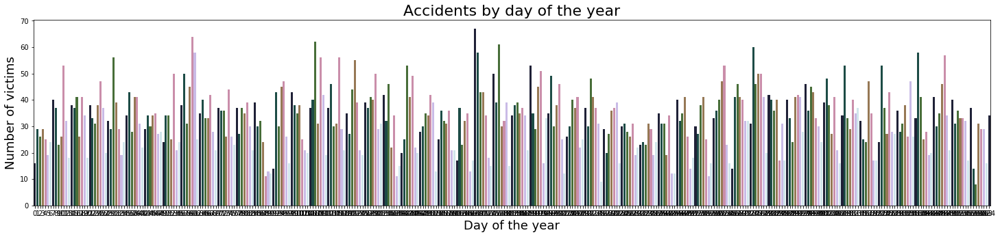

In [91]:
palette = sns.color_palette("cubehelix", 7)

plt.figure(figsize=(25,5))
ax = sns.barplot(x= acc_by_day.index, y="Numero_victimes",
                  palette=palette, data=acc_by_day)
ax.set_xlabel('Day of the year', fontsize=18)
ax.set_ylabel('Number of victims', fontsize=18)
ax.set_title('Accidents by day of the year', fontsize=22);
#ax.savefig('Acc_by_day_bar_cube.png', dpi=400)

### -  Average Accidents by week day 

In [41]:
acc_by_weekday = acc_18.groupby(['Descripcio_dia_setmana'], as_index=False).mean()

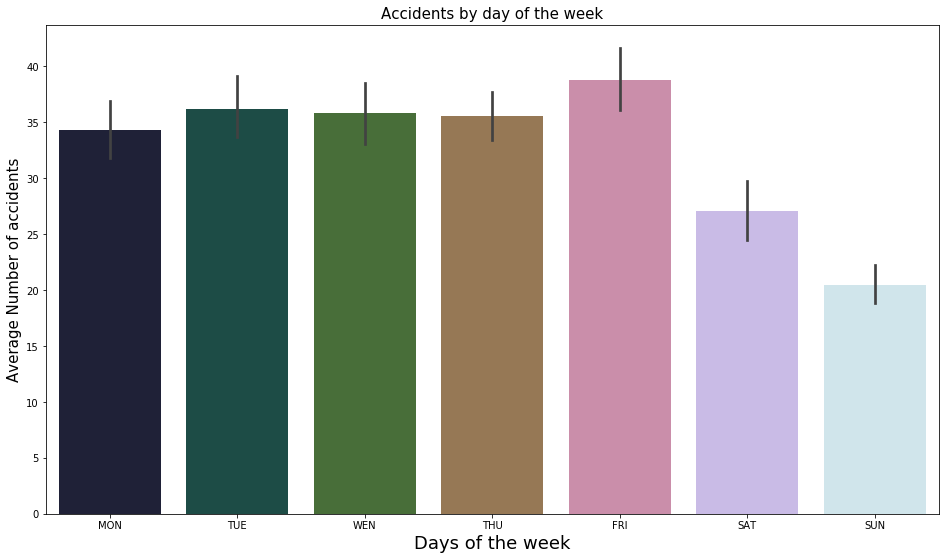

In [74]:
palette = sns.color_palette("cubehelix", 7)
labels  = ['MON', 'TUE', 'WEN', 'THU', 'FRI', 'SAT', 'SUN']

plt.figure(figsize=(16,9))
ax = sns.barplot(x="Descripcio_dia_setmana", y="Numero_victimes",
                  palette=palette, data=acc_by_day)
ax.set_xlabel('Days of the week', fontsize=18)
ax.set_xticklabels(labels)
ax.set_ylabel('Average Number of accidents', fontsize=15)
ax.set_title('Accidents by day of the week', fontsize=15)
plt.savefig('Acc_by_weekday_bar_cube.png', dpi=400);

### Amound of accidents by day type

In [94]:
acc_18.loc[(acc_18['Descripcio_dia_setmana']=='Diumenge')|(acc_18['Descripcio_dia_setmana']=='Dissabte'),'Descripcio_tipus_dia']='weekend'

In [95]:
acc_by_day_type =acc_18.groupby(['Descripcio_tipus_dia','Descripcio_torn'], as_index=False).sum()
acc_by_day_type

,Descripcio_tipus_dia,Descripcio_torn,Codi_districte,Codi_barri,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud
0,Laboral,Matí,16244,91039,2,3711,58,3771,6347,20144.834377,343760.401325
1,Laboral,Nit,3484,19390,5,856,20,881,1381,1570.617187,30056.289804
2,Laboral,Tarda,18811,104679,6,4658,110,4774,7599,10635.044556,287071.126634
3,weekend,Matí,2991,16537,1,755,12,768,1169,1332.274665,66836.453395
4,weekend,Nit,2148,12186,4,512,12,528,872,964.255231,59756.830531
5,weekend,Tarda,4365,24473,3,1149,24,1176,1725,1949.742107,78664.242697


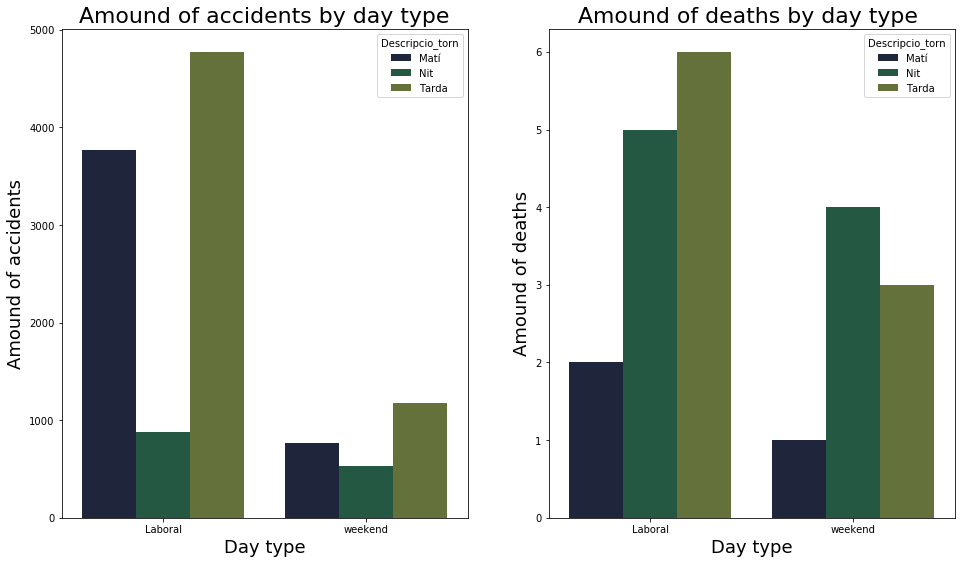

In [108]:
palette = sns.color_palette("cubehelix")


fig, (ax1, ax2) = plt.subplots(1,2,figsize=(16,9))
sns.barplot(x="Descripcio_tipus_dia", y="Numero_victimes",hue='Descripcio_torn',
                  palette=palette, data=acc_by_day_type, ax=ax1)
ax1.set_title('Amound of accidents by day type', fontsize=22)
ax1.set_xlabel('Day type',fontsize=18)
ax1.set_ylabel('Amound of accidents',fontsize=18)

sns.barplot(x="Descripcio_tipus_dia", y="Numero_morts",hue='Descripcio_torn',
                  palette=palette, data=acc_by_day_type, ax=ax2)
ax2.set_title('Amound of deaths by day type ', fontsize=22)
ax2.set_xlabel('Day type',fontsize=18)
ax2.set_ylabel('Amound of deaths',fontsize=18)
plt.savefig('Acc_by_day_type.png', dpi=400)

## ACCIDENTS BY HOUR OF THE DAY

In [76]:
acc_by_hour = acc_18.groupby(acc_18.datetime.dt.time, as_index=False).sum()
acc_by_hour.head()

,Codi_districte,Codi_barri,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud
0,759,4169,1,217,4,222,332,358.769361,6872.233090
1,621,3580,1,130,2,133,233,262.202663,5009.569738
2,381,2109,3,95,2,100,154,184.068654,3518.918535
3,363,2037,2,72,2,76,137,158.078105,3021.901448
4,290,1581,0,60,0,60,128,142.905747,2732.396434


Text(0.5, 1.0, 'Amound of accidents by hour')

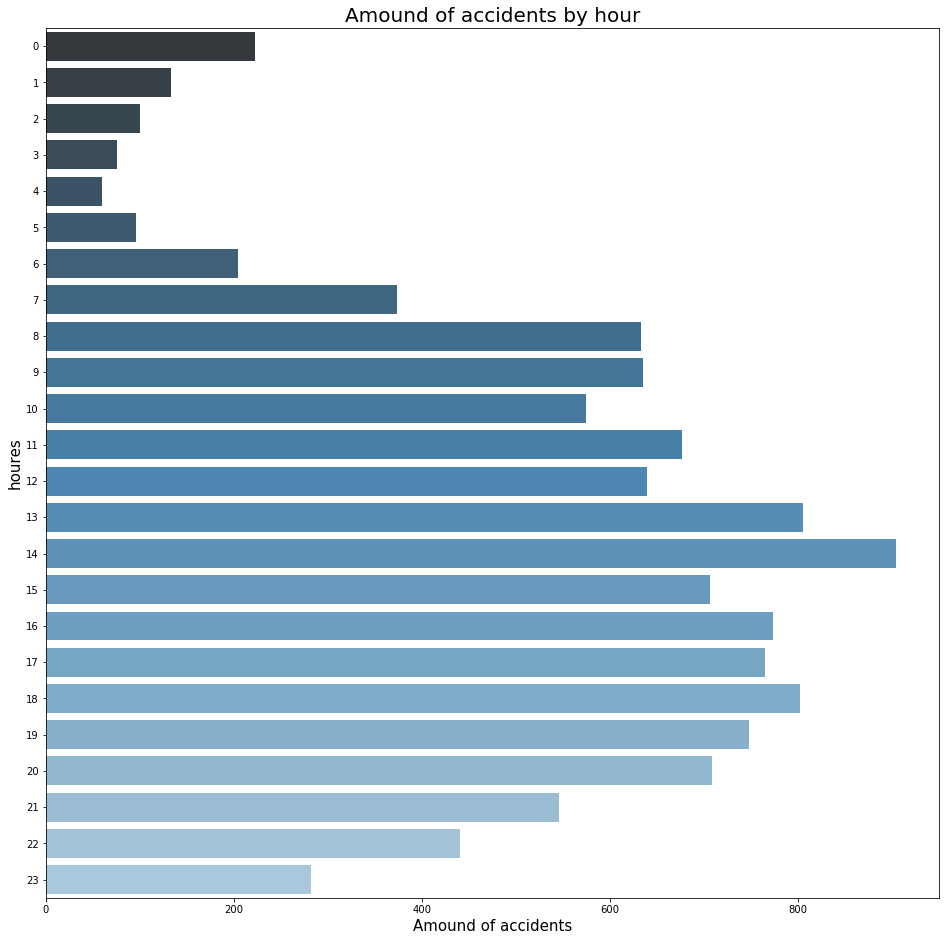

In [89]:
plt.figure(figsize=(16,16))
ax=sns.barplot(x="Numero_victimes", y=acc_by_hour.index, data=acc_by_hour, orient='h', palette="Blues_d")
ax.set_xlabel('Amound of accidents', fontsize=15)
ax.set_ylabel('houres', fontsize=15)
ax.set_title('Amound of accidents by hour', fontsize=20)
plt.savefig('Acc_by_hour2.png', dpi=300)


## 2.2 Accidents in Space

### Accidents by district

In [187]:
acc_dist= acc_18.groupby(['Codi_districte','Nom_districte'],as_index=False).sum()


In [188]:
acc_dist = acc_dist[['Codi_districte','Nom_districte','Numero_morts', 'Numero_lesionats_lleus',
                     'Numero_lesionats_greus', 'Numero_victimes','Numero_vehicles_implicats']]
acc_dist['codi_barri']=range(1,11)
acc_dist['codi_barri']=acc_dist.codi_barri.astype('str')
acc_dist['codi_barri']=acc_dist['codi_barri'].apply(lambda x: x.zfill(2))

In [189]:
import geojson
import folium

In [191]:
with open('bcn-geodata\districtes\districtes.geojson') as f:
    geojs = geojson.load(f)

In [192]:
m = folium.Map(location=[41.3902, 2.1540], 
               zoom_start=12,
               tiles='Stamen Terrain')
               
m.choropleth(
    geo_data=geojs,
    name='choropleth',
    data=acc_dist,
    columns=['codi_barri','Numero_victimes'],
    key_on="properties.DISTRICTE",
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='accidents by District'
)
folium.LayerControl().add_to(m)
               
m.save('acc_by_districte.html')

c:\program files\python38\lib\site-packages\folium\folium.py:411: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


In [193]:
m

### Acidents by neighborhood

In [197]:
acc_barri= acc_18.groupby(['Codi_barri','Nom_barri'],as_index=False).sum()

In [198]:
acc_barri['codi_barri']=range(1,74)
acc_barri['codi_barri']=acc_barri.codi_barri.astype('str')
acc_barri['codi_barri']=acc_barri['codi_barri'].apply(lambda x: x.zfill(2))

In [199]:
with open('bcn-geodata/barris/barris.geojson') as f:
    geojs2 = geojson.load(f)

In [200]:
m = folium.Map(location=[41.3902, 2.1540], 
               zoom_start=12,
               tiles='Stamen Terrain')


m.choropleth(
    geo_data=geojs2,
    name='choropleth',
    data=acc_barri,
    columns=['codi_barri','Numero_victimes'],
    key_on="properties.BARRI",
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    
    legend_name='accidents by neigbourhood'
)
folium.LayerControl().add_to(m)
               
m.save('acc_by_neighbourhood.html')

In [201]:
m

###  accident's location by street type

In [268]:
acc_graves_18 = acc_18.loc[(acc_18['Numero_morts'] != 0) | (acc_18['Numero_lesionats_greus'] != 0)]

In [269]:
acc_graves_18.Street_type.value_counts()

internal street    117
Main street        102
acces-Highway       23
Name: Street_type, dtype: int64

In [274]:
c = folium.Map(location=[41.3902, 2.1540], 
               zoom_start=13,
               tiles='cartodbpositron')

for index, row in acc_graves_18.iterrows():
    radi = (row['Numero_morts']*6 + row['Numero_victimes']*3)
    acc_gra =(row['Numero_morts'],row['Numero_victimes'])
    popup_text = "<br>adress:     {}<br> total death:     {}<br> total injured: {}"
    popup_text = popup_text.format(row["Nom_carrer"], row["Numero_morts"], row["Numero_victimes"], acc_gra)
    if row['Street_type'] == 'acces-Highway':
        color="#3661bf"
    elif row['Street_type'] == 'Main street':
        color="#9f0a0a"
    else:
        color="#36bf38"
    folium.CircleMarker(location=[row['Latitud'],row['Longitud']],
                         radius=radi,
                         color=color,
                         popup = popup_text,
                         fill=True).add_to(c)
    c.save('fatal_acc_2018.html')
        

In [275]:
c

### MAP OF ACCIDENT'S LOCATION BY HOUR 

In [133]:
acc_18.loc[acc_18.datetime.dt.hour ==1 ]

,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Nom_carrer,Descripcio_dia_setmana,Descripcio_tipus_dia,Descripcio_torn,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud,Street_type,datetime
118,2018S000313,3,Sants-Montjuïc,12,la Marina del Prat Vermell,Motors ...,Dissabte,weekend,Nit,No és causa del vianant,0,0,0,0,1,2.132063,41.346800,internal street,2018-01-13 01:00:00
189,2018S009170,3,Sants-Montjuïc,11,el Poble-sec,Litoral (Llobregat) ...,Dissabte,weekend,Nit,Transitar a peu per la calçada,1,0,0,1,1,2.159933,41.355195,acces-Highway,2018-12-01 01:00:00
302,2018S003285,3,Sants-Montjuïc,12,la Marina del Prat Vermell,Miramar ...,Dissabte,weekend,Nit,No és causa del vianant,0,2,0,2,1,2.171329,41.365928,internal street,2018-04-28 01:00:00
331,2018S008377,3,Sants-Montjuïc,13,la Marina de Port,Llorca ...,Divendres,Laboral,Nit,No és causa del vianant,0,0,0,0,2,2.141364,41.364618,internal street,2018-11-02 01:00:00
384,2018S004824,3,Sants-Montjuïc,11,el Poble-sec,Estadi / Santa Madrona ...,Dissabte,weekend,Nit,No és causa del vianant,0,2,0,2,1,2.159001,41.367401,internal street,2018-06-23 01:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9780,2018S009112,8,Nou Barris,50,les Roquetes,Mina de la Ciutat ...,Dijous,Laboral,Nit,No és causa del vianant,0,1,0,1,1,2.175499,41.447973,internal street,2018-11-29 01:00:00
9783,2018S007796,9,Sant Andreu,58,Baró de Viver,Santa Coloma / Tiana ...,Diumenge,weekend,Nit,No és causa del vianant,0,1,0,1,2,2.200259,41.448656,internal street,2018-10-14 01:00:00
9824,2018S005233,9,Sant Andreu,57,la Trinitat Vella,Tossal ...,Dissabte,weekend,Nit,No és causa del vianant,0,0,0,0,2,2.190036,41.448584,internal street,2018-07-07 01:00:00
9859,2018S001423,9,Sant Andreu,57,la Trinitat Vella,Trinitat / Mireia ...,Dijous,Laboral,Nit,No és causa del vianant,0,0,0,0,1,2.190279,41.450096,internal street,2018-02-22 01:00:00


In [277]:
def df_by_hour(h):
    result = acc_18.loc[acc_18.datetime.dt.hour==h]
    return result

In [309]:
def dot_map(hora,data_acc):
    d = folium.Map(location=[41.3902, 2.1540],
                   width='50%', 
                   height='100%',
                   zoom_start=13,
                   tiles='cartodbpositron')

    for index, row in data_acc.iterrows():
        radi = (row['Numero_morts']*6 + row['Numero_victimes']*3)
        acc_gra =(row['Numero_morts'],row['Numero_victimes'])
        popup_text = "<br>adress: {}<br> total death: {}<br> total injured: {}"
        popup_text = popup_text.format(row["Nom_carrer"], row["Numero_morts"], row["Numero_victimes"], acc_gra)
        if row['Numero_morts'] > 0:
            color="#E37222"
        else:
            color="#0A8A9F"
        folium.CircleMarker(location=[row['Latitud'],row['Longitud']],
                             radius=radi,
                             color=color,
                             popup = popup_text,
                             fill=True).add_to(d)
        d.save(f"acc_h_{hora}.html")
    return d

In [315]:
def dot_map_n(hora,data_acc):
    d = folium.Map(location=[41.3902, 2.1540],
                   width='50%', 
                   height='100%',
                   zoom_start=13,
                   tiles='cartodbdark_matter')

    for index, row in data_acc.iterrows():
        radi = (row['Numero_morts']*6 + row['Numero_victimes']*3)
        acc_gra =(row['Numero_morts'],row['Numero_victimes'])
        popup_text = "<br>adress: {}<br> total death: {}<br> total injured: {}"
        popup_text = popup_text.format(row["Nom_carrer"], row["Numero_morts"], row["Numero_victimes"], acc_gra)
        if row['Numero_morts'] > 0:
            color="#E37222"
        else:
            color="#0A8A9F"
        folium.CircleMarker(location=[row['Latitud'],row['Longitud']],
                             radius=radi,
                             color=color,
                             popup = popup_text,
                             fill=True).add_to(d)
        d.save(f"acc_h_{hora}.html")
    return d

In [316]:
#for type of accident
""" 
if row['Street_type'] == 'acces-Highway':
            color="#339c3f"
        elif row['Street_type'] == 'Main street':
            color="#0A8A9F"
        else:
            color="#E37222
""""

SyntaxError: EOL while scanning string literal (<ipython-input-316-c06795772a29>, line 9)

## Accidents 1am

In [317]:
acc_at_1 = df_by_hour(1)
hour = '1'

In [318]:
dot_map_n(hour,acc_at_1)

## Accidents 2am

In [138]:
acc_at_2 = df_by_hour(2)
hour = '2'

In [139]:
dot_map_n(hour, acc_at_2)

## Accidents 3am

In [140]:
acc_at_3 = df_by_hour(3)
hour = '3'

In [141]:
dot_map_n(hour, acc_at_3)

## Accidents 4am

In [142]:
acc_at_4 = df_by_hour(4)
hour = '4'

In [143]:
dot_map_n(hour, acc_at_4)

## Accidents 5am

In [144]:
acc_at_5 = df_by_hour(5)
hour = '5'

In [146]:
dot_map_n(hour, acc_at_5)

## Accidents 6am

In [149]:
acc_at_6 = df_by_hour(6)
hour = '6'

In [150]:
dot_map(hour, acc_at_6)

## Accidents 7am

In [151]:
acc_at_7 = df_by_hour(7)
hour = '7'

In [152]:
dot_map(hour, acc_at_7)

## Accidents 8 am

In [153]:
acc_at_8 = df_by_hour(8)
hour = '8'

In [154]:
dot_map(hour, acc_at_8)

## Accidents 9am 

In [155]:
acc_at_9 = df_by_hour(9)
hour = 9

In [156]:
dot_map(hour, acc_at_9)

## Accidents 10am

In [157]:
acc_at_10 = df_by_hour(10)
hour = '10'

In [158]:
dot_map(hour, acc_at_10)

## Accidents 11am

In [159]:
acc_at_11 = df_by_hour(11)
hour = '11'

In [160]:
dot_map(hour, acc_at_11)

## Accidents 12am

In [161]:
acc_at_12 = df_by_hour(12)
hour = '12'

In [162]:
dot_map(hour, acc_at_12)

## Accidents 01pm

In [163]:
acc_at_13 = df_by_hour(13)
hour = '13'

In [164]:
dot_map(hour, acc_at_13)

## Accidents 02pm

In [165]:
acc_at_14 = df_by_hour(14)
hour = '14'

In [166]:
dot_map(hour, acc_at_14)

## Accidents 03pm

In [167]:
acc_at_15 = df_by_hour(15)
hour = '15'

In [168]:
dot_map(hour, acc_at_15)

## Accidents 04pm

In [169]:
acc_at_16 = df_by_hour(16)
hour = '16'

In [170]:
dot_map(hour, acc_at_16)

## Accidents 05pm

In [171]:
acc_at_17 = df_by_hour(17)
hour = '17'

In [172]:
dot_map(hour, acc_at_17)

## Accidents 06pm

In [173]:
acc_at_18 = df_by_hour(18)
hour = '18'

In [174]:
dot_map(hour, acc_at_18)

## Accidents 07pm

In [175]:
acc_at_19 = df_by_hour(19)
hour = '19'

In [176]:
dot_map(hour, acc_at_19)

## Accidents 08pm

In [177]:
acc_at_20 = df_by_hour(20)
hour = '20'

In [178]:
dot_map_n(hour, acc_at_20)

## Accidents 09pm

In [179]:
acc_at_21 = df_by_hour(21)
hour = '21'

In [180]:
dot_map_n(hour, acc_at_21)

## Accidents 10pm

In [181]:
acc_at_22 = df_by_hour(22)
hour = '22'

In [182]:
dot_map_n(hour,acc_at_22)

## Accidents 11pm

In [183]:
acc_at_23 = df_by_hour(23)
hour = '23'

In [184]:
dot_map_n(hour, acc_at_23)

## Accidents 12pm

In [185]:
acc_at_24 = df_by_hour(0)
hour = '24'

In [186]:
dot_map_n(hour, acc_at_24)

## 2.3 Vehicle envolves in accidents

In [408]:
acc_veh_18 = pd.read_csv('https://opendata-ajuntament.barcelona.cat/data/dataset/317e3743-fb79-4d2f-a128-5f12d2c9a55a/resource/6e2daeb5-e359-43ad-b0b5-7fdf438c8d6f/download/2018_accidents_vehicles_gu_bcn_.csv')
acc_veh_18.head()

,Codi_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Num_postal,Descripcio_dia_setmana,Dia_setmana,...,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,Descripcio_color,Descripcio_carnet,Antiguitat_carnet,Coordenada_UTM_X,Coordenada_UTM_Y,Longitud,Latitud
0,2018S007344,1,Ciutat Vella,1,el Raval,269108,Rambla ...,1,Diumenge,Dg,...,Turisme,CORDOBA,SEAT,Blanc,B,5,431228.30,4581110.84,2.176455,41.376735
1,2018S009617,1,Ciutat Vella,1,el Raval,701265,B-10 (Besòs) ...,K110,Dilluns,Dl,...,Turisme,206,PEUGEOT,Blau,B,1,431320.52,4580791.56,2.177594,41.373868
2,2018S008382,1,Ciutat Vella,2,el Barri Gòtic,34308,Ferran ...,2,Divendres,Dv,...,"Camió rígid > 3,5 tones",Desconegut,DAF-HERMANNS,Taronja,C,25,431052.34,4581514.69,2.174305,41.380358
3,2018S002684,1,Ciutat Vella,2,el Barri Gòtic,55909,Call ...,21,Dilluns,Dl,...,"Camió rígid > 3,5 tones",ML140E24 E,IVECO FIAT,Blanc,C,11,431241.33,4581757.56,2.176538,41.382561
4,2018S004886,1,Ciutat Vella,2,el Barri Gòtic,82901,Colom ...,25,Dimarts,Dm,...,Taxi,TOLEDO,SEAT,Negre/Groc,B,5,431390.44,4581135.49,2.178391,41.376971


In [409]:
acc_veh_18.shape

(19079, 28)

In [410]:
acc_veh_18.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19079 entries, 0 to 19078
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Codi_expedient            19079 non-null  object 
 1   Codi_districte            19079 non-null  int64  
 2   Nom_districte             19079 non-null  object 
 3   Codi_barri                19079 non-null  int64  
 4   Nom_barri                 19079 non-null  object 
 5   Codi_carrer               19079 non-null  int64  
 6   Nom_carrer                19079 non-null  object 
 7   Num_postal                5144 non-null   object 
 8   Descripcio_dia_setmana    19079 non-null  object 
 9   Dia_setmana               19079 non-null  object 
 10  Descripcio_tipus_dia      19079 non-null  object 
 11  Any                       19079 non-null  int64  
 12  Mes_any                   19079 non-null  int64  
 13  Nom_mes                   19079 non-null  object 
 14  Dia_me

### DATA WRANGLING AND CLEANING

In [411]:
acc_veh_18.columns

Index(['Codi_expedient', 'Codi_districte', 'Nom_districte', 'Codi_barri',
       'Nom_barri', 'Codi_carrer', 'Nom_carrer', 'Num_postal ',
       'Descripcio_dia_setmana', 'Dia_setmana', 'Descripcio_tipus_dia', 'Any',
       'Mes_any', 'Nom_mes', 'Dia_mes', 'Hora_dia', 'Descripcio_torn',
       'Descripcio_causa_vianant', 'Descripcio_tipus_vehicle',
       'Descripcio_model', 'Descripcio_marca', 'Descripcio_color',
       'Descripcio_carnet', 'Antiguitat_carnet', 'Coordenada_UTM_X',
       'Coordenada_UTM_Y', 'Longitud', 'Latitud'],
      dtype='object')

In [412]:
acc_veh_18['datetime'] = pd.to_datetime({'year':acc_veh_18.Any,'month':acc_veh_18.Mes_any, 'day':acc_veh_18.Dia_mes, 'hour':acc_veh_18.Hora_dia})

In [413]:
acc_veh_18.drop(['Num_postal ','Dia_setmana', 'Descripcio_tipus_dia', 'Any',
       'Mes_any', 'Nom_mes', 'Dia_mes', 'Hora_dia','Descripcio_color',
       'Descripcio_carnet', 'Antiguitat_carnet','Coordenada_UTM_X',
       'Coordenada_UTM_Y', 'Longitud', 'Latitud'],axis=1,inplace=True)

In [414]:
acc_veh_18.head()

,Codi_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Descripcio_dia_setmana,Descripcio_torn,Descripcio_causa_vianant,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,datetime
0,2018S007344,1,Ciutat Vella,1,el Raval,269108,Rambla ...,Diumenge,Nit,No és causa del vianant,Turisme,CORDOBA,SEAT,2018-09-30
1,2018S009617,1,Ciutat Vella,1,el Raval,701265,B-10 (Besòs) ...,Dilluns,Nit,No és causa del vianant,Turisme,206,PEUGEOT,2018-12-17
2,2018S008382,1,Ciutat Vella,2,el Barri Gòtic,34308,Ferran ...,Divendres,Nit,No és causa del vianant,"Camió rígid > 3,5 tones",Desconegut,DAF-HERMANNS,2018-11-02
3,2018S002684,1,Ciutat Vella,2,el Barri Gòtic,55909,Call ...,Dilluns,Nit,No és causa del vianant,"Camió rígid > 3,5 tones",ML140E24 E,IVECO FIAT,2018-04-09
4,2018S004886,1,Ciutat Vella,2,el Barri Gòtic,82901,Colom ...,Dimarts,Nit,No és causa del vianant,Taxi,TOLEDO,SEAT,2018-06-26


In [415]:
acc_veh_18.shape

(19079, 14)

In [416]:
acc_veh_18.duplicated().sum()

71

In [419]:
acc_veh_18.nunique()

Codi_expedient              9920
Codi_districte                10
Nom_districte                 10
Codi_barri                    73
Nom_barri                     73
Codi_carrer                 1166
Nom_carrer                  3198
Descripcio_dia_setmana         7
Descripcio_torn                3
Descripcio_causa_vianant       6
Descripcio_tipus_vehicle      15
Descripcio_model            1995
Descripcio_marca             190
datetime                    5127
dtype: int64

In [418]:
acc_veh_18.Descripcio_tipus_vehicle.replace({'Quadricicle > 75 cc':'Veh. mobilitat personal amb motor', 
                                             'Quadricicle < 75 cc':'Veh. mobilitat personal amb motor',
                                             'Microbús <= 17':'Autobús',
                                             'Autocaravana':'Autobús',
                                             'Autobús articulat':'Autobús',
                                             'Microbús <= 17' : 'Autobús',
                                             'Camió rígid <= 3,5 tones' : 'Camió',
                                             'Camió rígid > 3,5 tones' : 'Camió',
                                             'Tractor camió' : 'Camió',
                                             'Autocar':'Autobús',
                                             'Altres vehicles sense motor' : 'Veh. mobilitat personal sense motor',
                                             'Altres vehicles sense motor' : 'Veh. mobilitat personal sense motor',  
                                            }, inplace=True)
acc_veh_18

,Codi_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Codi_carrer,Nom_carrer,Descripcio_dia_setmana,Descripcio_torn,Descripcio_causa_vianant,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,datetime
0,2018S007344,1,Ciutat Vella,1,el Raval,269108,Rambla ...,Diumenge,Nit,No és causa del vianant,Turisme,CORDOBA,SEAT,2018-09-30 00:00:00
1,2018S009617,1,Ciutat Vella,1,el Raval,701265,B-10 (Besòs) ...,Dilluns,Nit,No és causa del vianant,Turisme,206,PEUGEOT,2018-12-17 00:00:00
2,2018S008382,1,Ciutat Vella,2,el Barri Gòtic,34308,Ferran ...,Divendres,Nit,No és causa del vianant,Camió,Desconegut,DAF-HERMANNS,2018-11-02 00:00:00
3,2018S002684,1,Ciutat Vella,2,el Barri Gòtic,55909,Call ...,Dilluns,Nit,No és causa del vianant,Camió,ML140E24 E,IVECO FIAT,2018-04-09 00:00:00
4,2018S004886,1,Ciutat Vella,2,el Barri Gòtic,82901,Colom ...,Dimarts,Nit,No és causa del vianant,Taxi,TOLEDO,SEAT,2018-06-26 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19074,2018S006251,10,Sant Martí,73,la Verneda i la Pau,150852,Fernando de los Ríos ...,Dilluns,Nit,No és causa del vianant,Turisme,VECTRA,OPEL,2018-08-13 23:00:00
19075,2018S006492,10,Sant Martí,73,la Verneda i la Pau,153205,Guipúscoa ...,Diumenge,Nit,No és causa del vianant,Turisme,307,PEUGEOT,2018-08-26 23:00:00
19076,2018S006492,10,Sant Martí,73,la Verneda i la Pau,153205,Guipúscoa ...,Diumenge,Nit,No és causa del vianant,Turisme,C4,CITROEN,2018-08-26 23:00:00
19077,2018S006492,10,Sant Martí,73,la Verneda i la Pau,153205,Guipúscoa ...,Diumenge,Nit,No és causa del vianant,Turisme,MINI COOPER,MINI,2018-08-26 23:00:00


In [421]:
acc_veh_18.Descripcio_tipus_vehicle.value_counts()

Turisme                                7707
Motocicleta                            6102
Furgoneta                              1248
Taxi                                    993
Ciclomotor                              891
Bicicleta                               782
Autobús                                 582
Camió                                   503
Veh. mobilitat personal amb motor       130
Tot terreny                              33
Altres vehicles amb motor                28
Desconegut                               27
Veh. mobilitat personal sense motor      22
Tren o tramvia                           17
Maquinària d'obres i serveis             14
Name: Descripcio_tipus_vehicle, dtype: int64

In [405]:
acc_veh_18.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19079 entries, 0 to 19078
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   Codi_expedient            19079 non-null  object        
 1   Codi_districte            19079 non-null  int64         
 2   Nom_districte             19079 non-null  object        
 3   Codi_barri                19079 non-null  int64         
 4   Nom_barri                 19079 non-null  object        
 5   Codi_carrer               19079 non-null  int64         
 6   Nom_carrer                19079 non-null  object        
 7   Descripcio_dia_setmana    19079 non-null  object        
 8   Descripcio_torn           19079 non-null  object        
 9   Descripcio_causa_vianant  19079 non-null  object        
 10  Descripcio_tipus_vehicle  19079 non-null  object        
 11  Descripcio_model          19079 non-null  object        
 12  Descripcio_marca  

## ACCIDENTS BY DAY OF THE WEEK & BY TYPE OF VEHICULE

In [422]:

acc_veh_day =acc_veh_18.pivot_table(index=['Descripcio_dia_setmana'], columns=['Descripcio_tipus_vehicle'], values=['Codi_expedient'], aggfunc='count')
acc_veh_day

Codi_expedient                           \
Descripcio_tipus_vehicle Altres vehicles amb motor Autobús Bicicleta  Camió   
Descripcio_dia_setmana                                                        
Dijous                                         6.0    81.0     140.0   76.0   
Dilluns                                        5.0   101.0     116.0   84.0   
Dimarts                                        2.0    93.0     143.0   92.0   
Dimecres                                       2.0   113.0     117.0   92.0   
Dissabte                                       3.0    64.0      64.0   33.0   
Diumenge                                       1.0    42.0      58.0   24.0   
Divendres                                      9.0    88.0     144.0  102.0   

                                                          \
Descripcio_tipus_vehicle Ciclomotor Desconegut Furgoneta   
Descripcio_dia_setmana                                     
Dijous                        132.0        6.0     224.0   
Dilluns                       128.0        4.0     214.0   
Dimarts                       156.0        5.0     201.0   
Dimecres                      133.0        2.0     208.0   
Dissabte                      102.0        3.0     111.0   
Diumenge                       81.0        4.0      66.0   
Divendres                     159.0        3.0     224.0   

                                                                          \
Descripcio_tipus_vehicle Maquinària d'obres i serveis Motocicleta   Taxi   
Descripcio_dia_setmana                                                     
Dijous                                            NaN      1027.0  130.0   
Dilluns                                           2.0       957.0  170.0   
Dimarts                                           2.0       998.0  151.0   
Dimecres                                          3.0      1016.0  136.0   
Dissabte                                          4.0       582.0  137.0   
Diumenge                                          2.0       409.0   94.0   
Divendres                                         1.0      1113.0  175.0   

                                                             \
Descripcio_tipus_vehicle Tot terreny Tren o tramvia Turisme   
Descripcio_dia_setmana                                        
Dijous                           5.0            2.0  1169.0   
Dilluns                          6.0            2.0  1089.0   
Dimarts                          4.0            1.0  1134.0   
Dimecres                         2.0            4.0  1181.0   
Dissabte                         3.0            4.0   972.0   
Diumenge                         3.0            2.0   871.0   
Divendres                       10.0            2.0  1291.0   

                                                            \
Descripcio_tipus_vehicle Veh. mobilitat personal amb motor   
Descripcio_dia_setmana                                       
Dijous                                                20.0   
Dilluns                                               22.0   
Dimarts                                               28.0   
Dimecres                                              25.0   
Dissabte                                               7.0   
Diumenge                                               9.0   
Divendres                                             19.0   

                                                              
Descripcio_tipus_vehicle Veh. mobilitat personal sense motor  
Descripcio_dia_setmana                                        
Dijous                                                   2.0  
Dilluns                                                  6.0  
Dimarts                                                  3.0  
Dimecres                                                 3.0  
Dissabte                                                 4.0  
Diumenge                                                 4.0  
Divendres                                                NaN

In [423]:
acc_veh_day.columns = acc_veh_day.columns.droplevel(0)
acc_veh_day

Descripcio_tipus_vehicle,Altres vehicles amb motor,Autobús,Bicicleta,Camió,Ciclomotor,Desconegut,Furgoneta,Maquinària d'obres i serveis,Motocicleta,Taxi,Tot terreny,Tren o tramvia,Turisme,Veh. mobilitat personal amb motor,Veh. mobilitat personal sense motor
Descripcio_dia_setmana,,,,,,,,,,,,,,,
Dijous,6.0,81.0,140.0,76.0,132.0,6.0,224.0,NaN,1027.0,130.0,5.0,2.0,1169.0,20.0,2.0
Dilluns,5.0,101.0,116.0,84.0,128.0,4.0,214.0,2.0,957.0,170.0,6.0,2.0,1089.0,22.0,6.0
Dimarts,2.0,93.0,143.0,92.0,156.0,5.0,201.0,2.0,998.0,151.0,4.0,1.0,1134.0,28.0,3.0
Dimecres,2.0,113.0,117.0,92.0,133.0,2.0,208.0,3.0,1016.0,136.0,2.0,4.0,1181.0,25.0,3.0
Dissabte,3.0,64.0,64.0,33.0,102.0,3.0,111.0,4.0,582.0,137.0,3.0,4.0,972.0,7.0,4.0
Diumenge,1.0,42.0,58.0,24.0,81.0,4.0,66.0,2.0,409.0,94.0,3.0,2.0,871.0,9.0,4.0
Divendres,9.0,88.0,144.0,102.0,159.0,3.0,224.0,1.0,1113.0,175.0,10.0,2.0,1291.0,19.0,NaN


In [424]:
acc_veh_day.reset_index(inplace=True)
acc_veh_day['dia_semana']=range(1,8)

In [425]:
acc_veh_day.columns

Index(['Descripcio_dia_setmana', 'Altres vehicles amb motor', 'Autobús',
       'Bicicleta', 'Camió', 'Ciclomotor', 'Desconegut', 'Furgoneta',
       'Maquinària d'obres i serveis', 'Motocicleta', 'Taxi', 'Tot terreny',
       'Tren o tramvia', 'Turisme', 'Veh. mobilitat personal amb motor',
       'Veh. mobilitat personal sense motor', 'dia_semana'],
      dtype='object', name='Descripcio_tipus_vehicle')

In [382]:
acc_veh_day


Descripcio_tipus_vehicle,Descripcio_dia_setmana,Altres vehicles amb motor,Altres vehicles sense motor,Autobús,Autobús articulat,Autocar,Autocaravana,Bicicleta,"Camió rígid <= 3,5 tones","Camió rígid > 3,5 tones",...,Quadricicle < 75 cc,Quadricicle > 75 cc,Taxi,Tot terreny,Tractor camió,Tren o tramvia,Turisme,Veh. mobilitat personal amb motor,Veh. mobilitat personal sense motor,dia_semana
0,Dijous,6.0,NaN,71.0,6.0,3.0,NaN,140.0,44.0,24.0,...,1.0,NaN,130.0,5.0,8.0,2.0,1169.0,19.0,2.0,1
1,Dilluns,5.0,4.0,85.0,9.0,5.0,NaN,116.0,47.0,25.0,...,NaN,NaN,170.0,6.0,12.0,2.0,1089.0,22.0,2.0,2
2,Dimarts,2.0,3.0,75.0,7.0,9.0,NaN,143.0,59.0,22.0,...,NaN,NaN,151.0,4.0,11.0,1.0,1134.0,28.0,NaN,3
3,Dimecres,2.0,2.0,90.0,14.0,9.0,NaN,117.0,44.0,39.0,...,NaN,NaN,136.0,2.0,9.0,4.0,1181.0,25.0,1.0,4
4,Dissabte,3.0,NaN,48.0,10.0,4.0,1.0,64.0,17.0,15.0,...,NaN,NaN,137.0,3.0,1.0,4.0,972.0,7.0,4.0,5
5,Diumenge,1.0,1.0,31.0,5.0,6.0,NaN,58.0,13.0,9.0,...,NaN,NaN,94.0,3.0,2.0,2.0,871.0,9.0,3.0,6
6,Divendres,9.0,NaN,76.0,7.0,4.0,1.0,144.0,56.0,35.0,...,NaN,1.0,175.0,10.0,11.0,2.0,1291.0,18.0,NaN,7


In [426]:
dias = ['Dilluns','Dimarts','Dimecres','Dijous','Divendres','Dissabte','Diumenge']
a = 0
for dia in dias:
    a += 1
    acc_veh_day.loc[acc_veh_day['Descripcio_dia_setmana']==dia, 'dia_semana']= a

In [427]:
acc_veh_day_sort = acc_veh_day.sort_values(by='dia_semana')
acc_veh_day_sort

Descripcio_tipus_vehicle,Descripcio_dia_setmana,Altres vehicles amb motor,Autobús,Bicicleta,Camió,Ciclomotor,Desconegut,Furgoneta,Maquinària d'obres i serveis,Motocicleta,Taxi,Tot terreny,Tren o tramvia,Turisme,Veh. mobilitat personal amb motor,Veh. mobilitat personal sense motor,dia_semana
1,Dilluns,5.0,101.0,116.0,84.0,128.0,4.0,214.0,2.0,957.0,170.0,6.0,2.0,1089.0,22.0,6.0,1
2,Dimarts,2.0,93.0,143.0,92.0,156.0,5.0,201.0,2.0,998.0,151.0,4.0,1.0,1134.0,28.0,3.0,2
3,Dimecres,2.0,113.0,117.0,92.0,133.0,2.0,208.0,3.0,1016.0,136.0,2.0,4.0,1181.0,25.0,3.0,3
0,Dijous,6.0,81.0,140.0,76.0,132.0,6.0,224.0,NaN,1027.0,130.0,5.0,2.0,1169.0,20.0,2.0,4
6,Divendres,9.0,88.0,144.0,102.0,159.0,3.0,224.0,1.0,1113.0,175.0,10.0,2.0,1291.0,19.0,NaN,5
4,Dissabte,3.0,64.0,64.0,33.0,102.0,3.0,111.0,4.0,582.0,137.0,3.0,4.0,972.0,7.0,4.0,6
5,Diumenge,1.0,42.0,58.0,24.0,81.0,4.0,66.0,2.0,409.0,94.0,3.0,2.0,871.0,9.0,4.0,7


###  VISUALIZATION ACCIDENTS BY DAY OF THE WEEK Radar Chart WITH SEABORN

In [401]:
%matplotlib inline

In [428]:
labels = np.array(acc_veh_day_sort.iloc[:,0])
angles = np.linspace(0, 2*np.pi, len(acc_veh_day_sort.iloc[:,1]), endpoint=False)
day_val = acc_veh_day_sort.iloc[:,2].values
title   = acc_veh_day_sort.columns[2:]


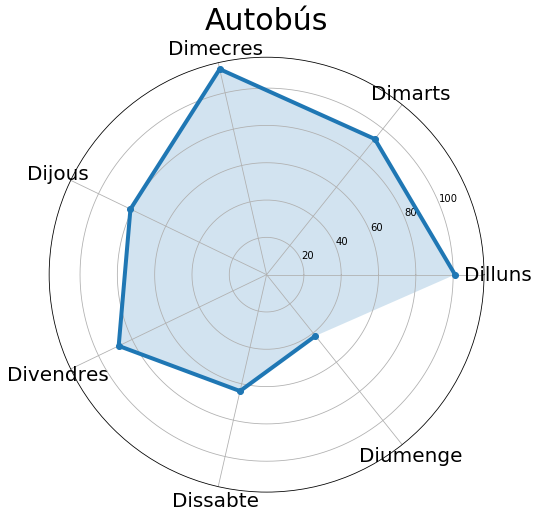

In [429]:

fig=plt.figure(figsize=(15,8))
ax = fig.add_subplot(111, polar=True)   # Set polar axis
ax.plot(angles, day_val, 'o-', linewidth=4)  # Draw the plot (or the frame on the radar chart)
ax.fill(angles, day_val, alpha=0.2)  #Fulfill the area
ax.set_thetagrids(angles * 180/np.pi, labels, fontsize=20)  # Set the label for each axis
ax.set_title(title[0], fontsize=30)  
ax.grid(True)

In [430]:
def make_spider(angle, val, label, tit):
    fig=plt.figure(figsize=(15,8))
    ax = fig.add_subplot(111, polar=True)   # Set polar axis
    ax.plot(angle,  val, 'o-', linewidth=4)  # Draw the plot (or the frame on the radar chart) agregar color
    ax.fill(angle, val, alpha=0.2)  #Fulfill the area
    ax.set_thetagrids(angles* 180/np.pi, labels, fontsize=20)  # Set the label for each axis
    ax.set_title(tit, fontsize=30)
    ax.grid(True)
    #plt.savefig(f'radar{tit}.png')
    
    #sns.palplot(sns.color_palette("cubehelix", 8))

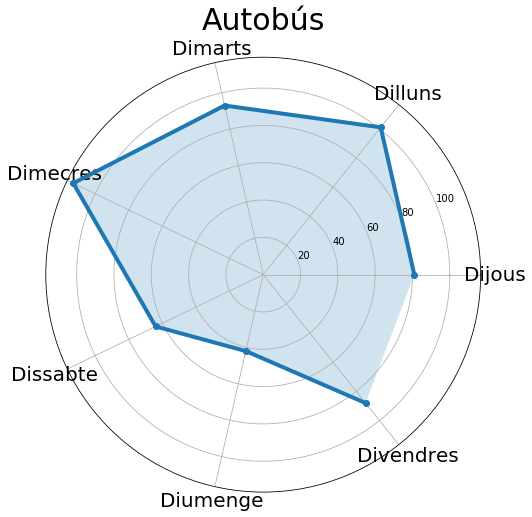

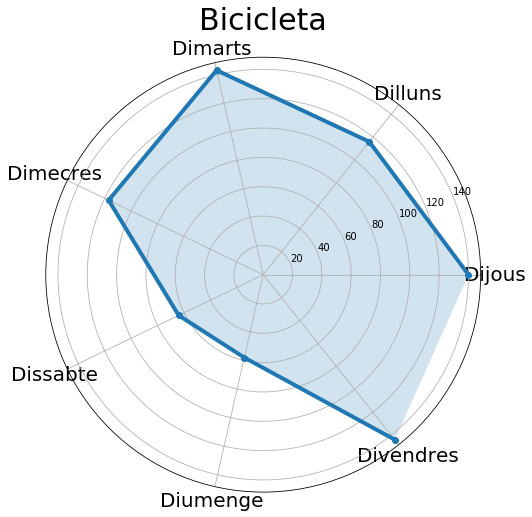

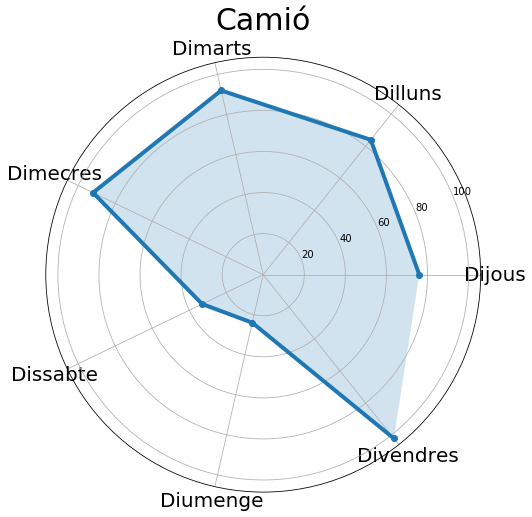

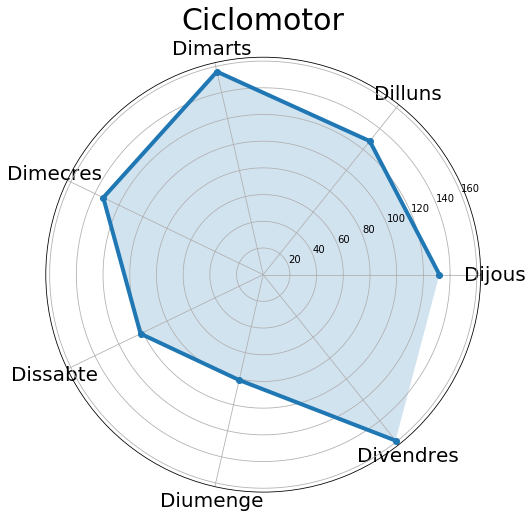

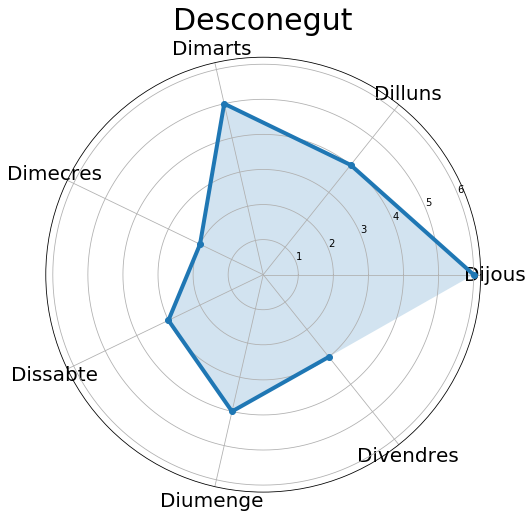

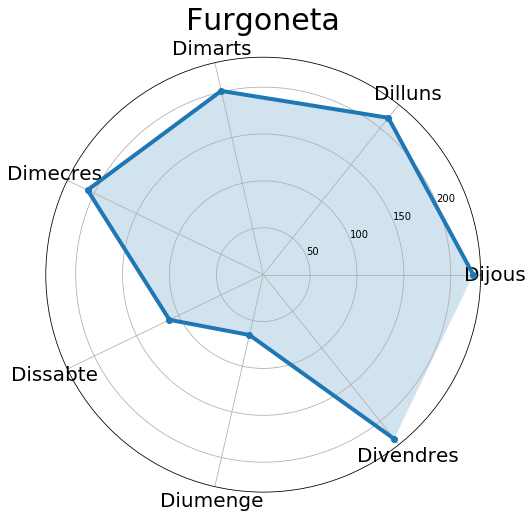

c:\program files\python38\lib\site-packages\matplotlib\projections\polar.py:55: RuntimeWarning: invalid value encountered in greater_equal
  r = np.where(r >= 0, r, np.nan)


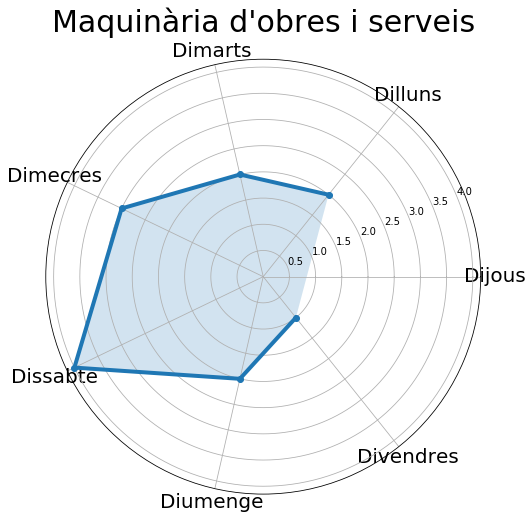

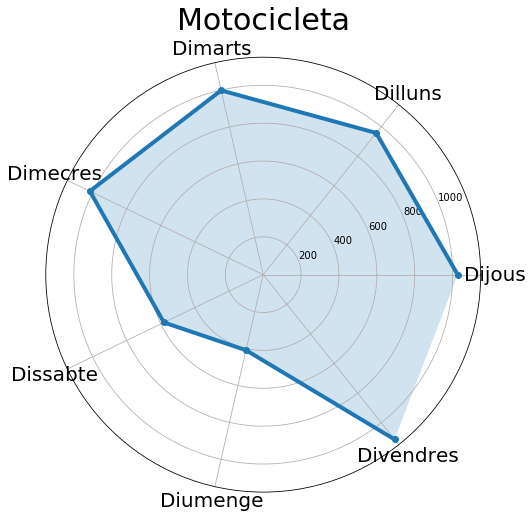

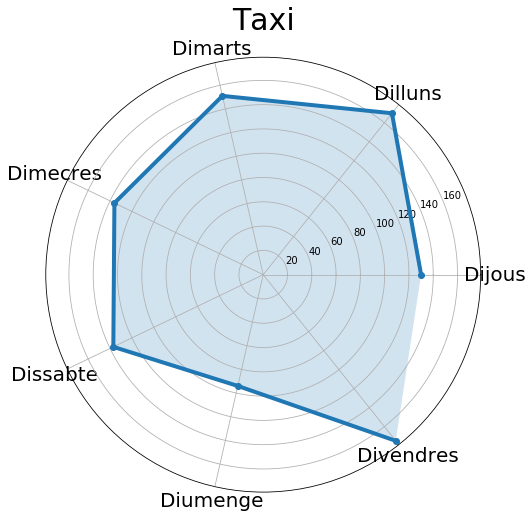

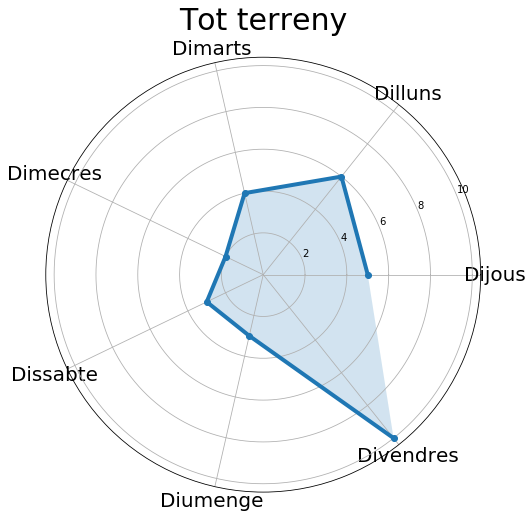

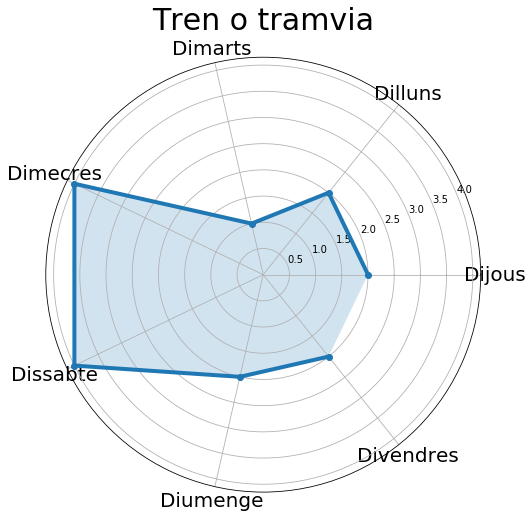

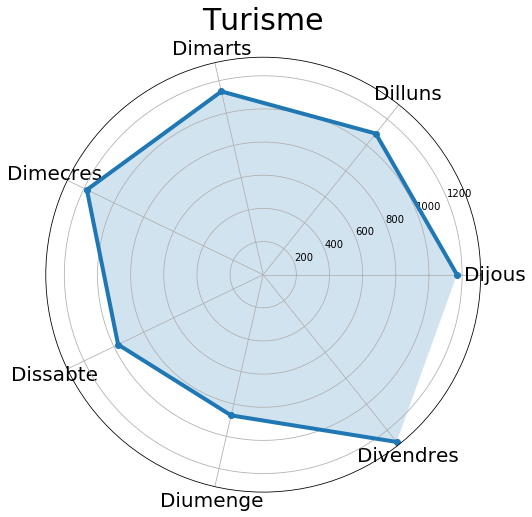

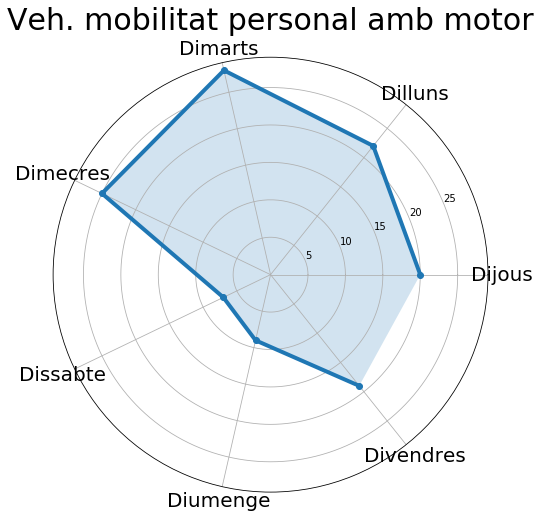

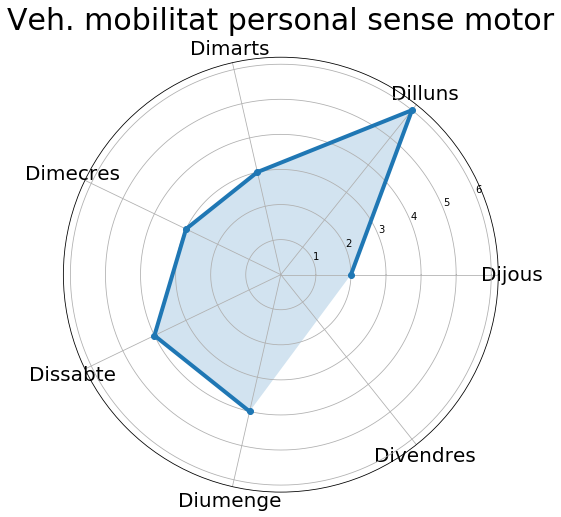

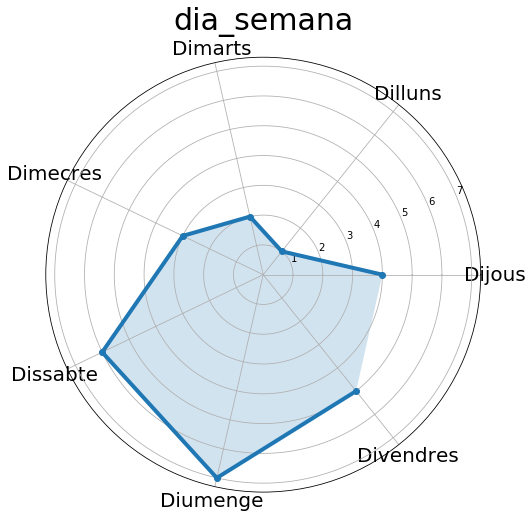

In [431]:
"""for row in range(0, len(acc_veh_day.index)):
make_spider( row=row, title=acc_veh_day[row], color=my_palette(row))
import random
color  = ['b','g','r','c','m','y','k']"""   
title   = list(acc_veh_day.columns)

for row in range(2, len(title)):
    labels  = np.array(acc_veh_day.iloc[:,0])
    angles  = np.linspace(0, 2*np.pi, len(acc_veh_day.iloc[:,row]), endpoint=False)
    day_val = acc_veh_day.iloc[:,row].values
    title1   = acc_veh_day.columns[row]
    #colorea   = random.choice(color)
    
    make_spider(angles, day_val, labels, title1)
    
    
    

## ACCIDENTS BY VEHICULE

In [434]:
acc_by_veh_type = acc_veh_18.groupby('Descripcio_tipus_vehicle', as_index=False)[['Codi_expedient']].count().sort_values(by='Codi_expedient',ascending=False)
acc_by_veh_type_top=acc_by_veh_type.head(7)

In [435]:
acc_by_veh_type.columns

Index(['Descripcio_tipus_vehicle', 'Codi_expedient'], dtype='object')

In [436]:
import seaborn as sns
sns.set(style="whitegrid") 

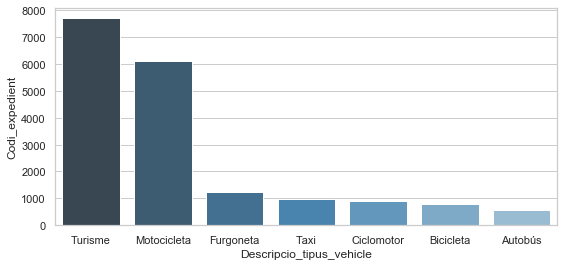

In [437]:
ax = plt.figure(figsize=(9,4))
sns.barplot(x="Descripcio_tipus_vehicle", y="Codi_expedient", data=acc_by_veh_type_top, palette="Blues_d")
plt.savefig('Acc_by_vehicule2.png', dpi=400)

In [439]:
acc_veh_gb = acc_veh_18[['Codi_expedient','Descripcio_tipus_vehicle',
       'Descripcio_model', 'Descripcio_marca',]]

In [440]:
acc_18.columns

Index(['Numero_expedient', 'Codi_districte', 'Nom_districte', 'Codi_barri',
       'Nom_barri', 'Nom_carrer', 'Descripcio_dia_setmana',
       'Descripcio_tipus_dia', 'Descripcio_torn', 'Descripcio_causa_vianant',
       'Numero_morts', 'Numero_lesionats_lleus', 'Numero_lesionats_greus',
       'Numero_victimes', 'Numero_vehicles_implicats', 'Longitud', 'Latitud',
       'Street_type', 'datetime'],
      dtype='object')

In [441]:
acc_veh_gb.head()

,Codi_expedient,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca
0,2018S007344,Turisme,CORDOBA,SEAT
1,2018S009617,Turisme,206,PEUGEOT
2,2018S008382,Camió,Desconegut,DAF-HERMANNS
3,2018S002684,Camió,ML140E24 E,IVECO FIAT
4,2018S004886,Taxi,TOLEDO,SEAT


In [443]:
acc_by_veh=pd.merge(acc_veh_gb, acc_18, how='outer', left_on='Codi_expedient', right_on='Numero_expedient')

In [444]:
acc_by_veh

,Codi_expedient,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Nom_carrer,...,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud,Street_type,datetime
0,2018S007344,Turisme,CORDOBA,SEAT,2018S007344,1,Ciutat Vella,1,el Raval,Rambla ...,...,No és causa del vianant,0,1,0,1,1,2.176455,41.376735,internal street,2018-09-30 00:00:00
1,2018S009617,Turisme,206,PEUGEOT,2018S009617,1,Ciutat Vella,1,el Raval,B-10 (Besòs) ...,...,No és causa del vianant,0,3,0,3,1,2.177594,41.373868,acces-Highway,2018-12-17 00:00:00
2,2018S008382,Camió,Desconegut,DAF-HERMANNS,2018S008382,1,Ciutat Vella,2,el Barri Gòtic,Ferran ...,...,No és causa del vianant,0,0,0,0,1,2.174305,41.380358,internal street,2018-11-02 00:00:00
3,2018S002684,Camió,ML140E24 E,IVECO FIAT,2018S002684,1,Ciutat Vella,2,el Barri Gòtic,Call ...,...,No és causa del vianant,0,0,0,0,1,2.176538,41.382561,internal street,2018-04-09 00:00:00
4,2018S004886,Taxi,TOLEDO,SEAT,2018S004886,1,Ciutat Vella,2,el Barri Gòtic,Colom ...,...,No és causa del vianant,0,2,0,2,3,2.178391,41.376971,Main street,2018-06-26 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19100,NaN,NaN,NaN,NaN,2018S008765,10,Sant Martí,66,el Parc i la Llacuna del Poblenou,Meridiana / Marina ...,...,No és causa del vianant,0,0,0,0,0,2.186871,41.394758,Main street,2018-11-16 12:00:00
19101,NaN,NaN,NaN,NaN,2018S009449,2,Eixample,5,el Fort Pienc,napols / Casp ...,...,No és causa del vianant,0,0,0,0,0,2.179047,41.395634,internal street,2018-12-11 16:00:00
19102,NaN,NaN,NaN,NaN,2018S009415,5,Sarrià-Sant Gervasi,26,Sant Gervasi - Galvany,Augusta ...,...,No és causa del vianant,0,0,0,0,0,2.140333,41.397784,Main street,2018-12-04 13:00:00
19103,NaN,NaN,NaN,NaN,2018S008677,5,Sarrià-Sant Gervasi,22,"Vallvidrera, el Tibidabo i les Planes",NaN,...,No és causa del vianant,0,0,0,0,0,2.102469,41.412709,internal street,2018-11-12 00:00:00


In [445]:
acc_graves_2018 = acc_by_veh.loc[(acc_by_veh['Numero_morts'] != 0) | (acc_by_veh['Numero_lesionats_greus'] != 0)]
acc_graves_2018

,Codi_expedient,Descripcio_tipus_vehicle,Descripcio_model,Descripcio_marca,Numero_expedient,Codi_districte,Nom_districte,Codi_barri,Nom_barri,Nom_carrer,...,Descripcio_causa_vianant,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud,Street_type,datetime
13,2018S006309,Bicicleta,Desconegut,Desconegut,2018S006309,1,Ciutat Vella,4,"Sant Pere, Santa Caterina i la Ribera",Lluís Companys ...,...,No és causa del vianant,0,1,1,2,1,2.181330,41.391254,internal street,2018-08-17 00:00:00
71,2018S004603,Bicicleta,Desconegut,Desconegut,2018S004603,2,Eixample,8,l'Antiga Esquerra de l'Eixample,Aragó / Casanova ...,...,No és causa del vianant,1,3,1,5,8,2.157337,41.386477,Main street,2018-06-16 00:00:00
72,2018S004603,Motocicleta,HW125 XENT,YAMAHA,2018S004603,2,Eixample,8,l'Antiga Esquerra de l'Eixample,Aragó / Casanova ...,...,No és causa del vianant,1,3,1,5,8,2.157337,41.386477,Main street,2018-06-16 00:00:00
73,2018S004603,Motocicleta,PES,HONDA,2018S004603,2,Eixample,8,l'Antiga Esquerra de l'Eixample,Aragó / Casanova ...,...,No és causa del vianant,1,3,1,5,8,2.157337,41.386477,Main street,2018-06-16 00:00:00
74,2018S004603,Motocicleta,PES125,HONDA,2018S004603,2,Eixample,8,l'Antiga Esquerra de l'Eixample,Aragó / Casanova ...,...,No és causa del vianant,1,3,1,5,8,2.157337,41.386477,Main street,2018-06-16 00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19071,2018S005965,Turisme,GOLF,VOLKSWAGEN,2018S005965,10,Sant Martí,71,Provençals del Poblenou,Diagonal / Espronceda ...,...,No és causa del vianant,0,1,1,2,2,2.202379,41.407029,Main street,2018-08-01 23:00:00
19074,2018S000065,Bicicleta,Desconegut,BTWIN,2018S000065,10,Sant Martí,71,Provençals del Poblenou,Bac de Roda / Corts Catalanes ...,...,No és causa del vianant,0,0,1,1,2,2.198190,41.411891,Main street,2018-01-03 23:00:00
19075,2018S000065,Turisme,FOCUS,FORD,2018S000065,10,Sant Martí,71,Provençals del Poblenou,Bac de Roda / Corts Catalanes ...,...,No és causa del vianant,0,0,1,1,2,2.198190,41.411891,Main street,2018-01-03 23:00:00
19076,2018S009004,Ciclomotor,TWEET,PEUGEOT,2018S009004,10,Sant Martí,71,Provençals del Poblenou,Corts Catalanes / Espronceda ...,...,No és causa del vianant,0,0,1,1,2,2.197063,41.411044,Main street,2018-11-24 23:00:00


In [446]:
acc_graves_type_veh = acc_graves_2018.groupby('Descripcio_tipus_vehicle', as_index=False).sum()

In [447]:
acc_graves_type_veh

,Descripcio_tipus_vehicle,Codi_districte,Codi_barri,Numero_morts,Numero_lesionats_lleus,Numero_lesionats_greus,Numero_victimes,Numero_vehicles_implicats,Longitud,Latitud
0,Altres vehicles amb motor,1,3,0,1,1,2,3,2.193746,41.386113
1,Autobús,66,330,1,5,17,23,22,38.813575,745.060166
2,Bicicleta,116,722,1,5,19,25,42,41.301045,786.549197
3,Camió,54,300,4,14,7,25,41,23.699829,455.302349
4,Ciclomotor,112,638,0,16,27,43,73,51.906696,993.556011
5,Furgoneta,139,804,1,4,30,35,57,64.885337,1241.937515
6,Maquinària d'obres i serveis,3,12,0,0,1,1,1,2.120804,41.329149
7,Motocicleta,861,4896,20,133,174,327,478,383.215547,7327.902420
8,Taxi,66,385,4,19,11,34,47,30.304157,579.530012
9,Tot terreny,3,15,0,0,1,1,2,2.146167,41.372857


In [448]:
acc_graves_top=acc_graves_type_veh[['Descripcio_tipus_vehicle','Numero_victimes']].sort_values(by='Numero_victimes',ascending=False).head(8)

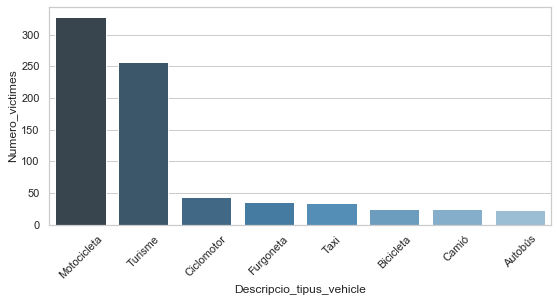

In [449]:
ax = plt.figure(figsize=(9,4))
g = sns.barplot(x="Descripcio_tipus_vehicle", y="Numero_victimes", data=acc_graves_top, palette="Blues_d")
plt.xticks(rotation=45)
plt.savefig('Acc_graves_by_vehicule_mean.png', dpi=400)